In [1]:
import os, warnings
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import dynamo as dyn
import pandas as pd
import spateo as st
import scanpy as sc
warnings.filterwarnings('ignore')

2023-09-15 22:01:31.732354: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-09-15 22:01:31.754122: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-15 22:01:32.083637: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


## Load the data

In [2]:
sample_id = "E7_8h"
os.chdir(f"/media/pc001/Yao/Projects/Project_drosophila/Data_v4/migration-hotspot/drosophila_{sample_id}_germ_layer_new")
cpo = [(41, 1209, 57), (13, 8, -3), (0, 0, 1)]

out_image_path = f"image/germband_reclustering"
Path(out_image_path).mkdir(parents=True, exist_ok=True)

In [3]:
germ_adata = st.read_h5ad(f"h5ad/{sample_id}_germband_v2.h5ad")
germ_pc = st.tdr.read_model(f"pc_models/Germband_{sample_id}_aligned_pc_model.vtk")
germ_adata

AnnData object with n_obs × n_vars = 20424 × 8136
    obs: 'area', 'slices', 'anno_cell_type', 'anno_tissue', 'anno_germ_layer', 'actual_stage', 'scc', 'anno_tissue_new', 'V_z', 'anno_germ_layer_new', 'backbone_nodes'
    uns: 'glm_degs', 'log1p'
    obsm: '2d_realign_spatial', '3d_align_spatial', 'V_cells_mapping', 'X_cells_mapping', 'X_pca', 'X_umap', 'raw_spatial', 'tdr_spatial'
    layers: 'X_counts', 'spliced', 'unspliced'

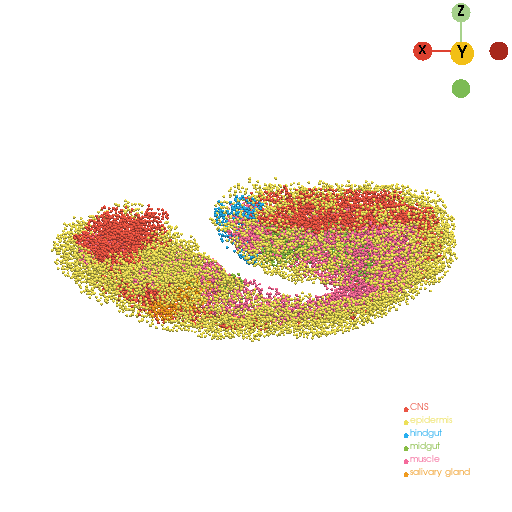

In [4]:
st.pl.three_d_plot(
    model=germ_pc,
    key="tissue",
    model_style="points",
    cpo=cpo,
    jupyter="static",
)

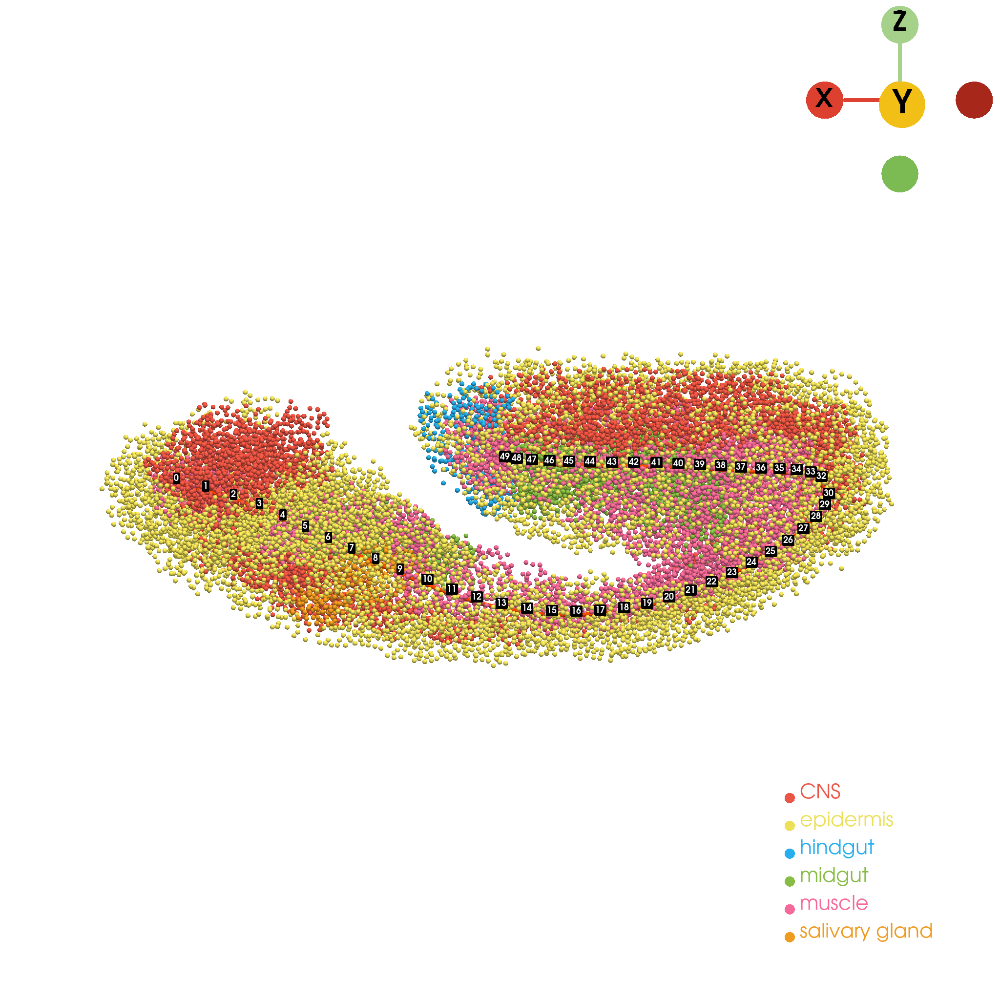

In [7]:
backbone = st.tdr.read_model(f"pc_models/Germband_{sample_id}_aligned_backbone_model.vtk")
st.pl.backbone(
    backbone_model=backbone,
    bg_model=germ_pc,
    bg_key="tissue",
    bg_opacity=1,
    nodes_key="updated_nodes",
    jupyter="static",
    cpo=cpo,
    #filename=os.path.join(out_image_path, f"{sample_id}_germband_backbone_model_labels.pdf")
)

## Reclustering

In [5]:
from typing import Optional, Tuple, Union

import matplotlib as mpl
import numpy as np
from pyvista import PolyData, UniformGrid, UnstructuredGrid

try:
    from typing import Literal
except ImportError:
    from typing_extensions import Literal


def add_model_labels(
    model: Union[PolyData, UnstructuredGrid, UniformGrid],
    labels: np.ndarray,
    key_added: str = "groups",
    where: Literal["point_data", "cell_data"] = "cell_data",
    colormap: Union[str, list, dict, np.ndarray] = "rainbow",
    alphamap: Union[float, list, dict, np.ndarray] = 1.0,
    mask_color: Optional[str] = "gainsboro",
    mask_alpha: Optional[float] = 0.0,
    inplace: bool = False,
) -> Tuple[Optional[PolyData or UnstructuredGrid], Optional[Union[str]]]:

        model = model.copy() if not inplace else model
        labels = np.asarray(labels).flatten()

        cu_arr = np.sort(np.unique(labels), axis=0).astype(object)
        raw_labels_hex = labels.copy().astype(object)
        raw_labels_alpha = labels.copy().astype(object)
        raw_labels_hex[raw_labels_hex == "mask"] = mpl.colors.to_hex(mask_color)
        raw_labels_alpha[raw_labels_alpha == "mask"] = mask_alpha

        # Set raw hex.
        if isinstance(colormap, str):
            if colormap in list(mpl.colormaps()):
                lscmap = mpl.cm.get_cmap(colormap)
                raw_hex_list = [mpl.colors.to_hex(lscmap(i)) for i in np.linspace(0, 1, len(cu_arr))]
                for label, color in zip(cu_arr, raw_hex_list):
                    raw_labels_hex[raw_labels_hex == label] = color
            else:
                raw_labels_hex[raw_labels_hex != "mask"] = mpl.colors.to_hex(colormap)
        elif isinstance(colormap, dict):
            for label, color in colormap.items():
                raw_labels_hex[raw_labels_hex == label] = mpl.colors.to_hex(color)
        elif isinstance(colormap, list) or isinstance(colormap, np.ndarray):
            raw_hex_list = np.array([mpl.colors.to_hex(color) for color in colormap]).astype(object)
            for label, color in zip(cu_arr, raw_hex_list):
                raw_labels_hex[raw_labels_hex == label] = color
        else:
            raise ValueError("`colormap` value is wrong." "\nAvailable `colormap` types are: `str`, `list` and `dict`.")

        # Set raw alpha.
        if isinstance(alphamap, float) or isinstance(alphamap, int):
            raw_labels_alpha[raw_labels_alpha != "mask"] = alphamap
        elif isinstance(alphamap, dict):
            for label, alpha in alphamap.items():
                raw_labels_alpha[raw_labels_alpha == label] = alpha
        elif isinstance(alphamap, list) or isinstance(alphamap, np.ndarray):
            raw_labels_alpha = np.asarray(alphamap).astype(object)
        else:
            raise ValueError(
                "`alphamap` value is wrong." "\nAvailable `alphamap` types are: `float`, `list` and `dict`."
            )

        # Set rgba.
        labels_rgba = [mpl.colors.to_rgba(c, alpha=a) for c, a in zip(raw_labels_hex, raw_labels_alpha)]
        labels_rgba = np.array(labels_rgba).astype(np.float32)

        # Added rgba of the labels.
        if where == "point_data":
            model.point_data[f"{key_added}_rgba"] = labels_rgba
        else:
            model.cell_data[f"{key_added}_rgba"] = labels_rgba

        plot_cmap = None

        # Added labels.
        if where == "point_data":
            model.point_data[key_added] = labels
        else:
            model.cell_data[key_added] = labels

        return model if not inplace else None, plot_cmap

In [6]:
germ_adata.X= germ_adata.layers["X_counts"].copy()
sc.pp.normalize_total(germ_adata)
sc.pp.log1p(germ_adata)

glm_data = germ_adata.uns["glm_degs"]["glm_result"]
glm_data= glm_data.loc[glm_data["log-likelihood"] >= -2500, :]
glm_data= glm_data.loc[glm_data["pval"] <= 1e-10, :]
glm_data

,status,family,log-likelihood,pval,qval
abd-A,ok,NB2,-2076.589111,0.000000e+00,0.000000e+00
Ppn,ok,NB2,-1974.638794,0.000000e+00,0.000000e+00
Ubx,ok,NB2,-1557.671631,0.000000e+00,0.000000e+00
pip,ok,NB2,-1390.018799,0.000000e+00,0.000000e+00
Abd-B,ok,NB2,-1281.470703,0.000000e+00,0.000000e+00
cnc,ok,NB2,-870.573486,0.000000e+00,0.000000e+00
Optix,ok,NB2,-530.287048,0.000000e+00,4.203895e-45
scro,ok,NB2,-440.053375,8.996336e-43,5.633682e-40
otp,ok,NB2,-401.759003,8.920972e-34,4.536314e-31
CG34190,ok,NB2,-806.002747,3.928670e-31,1.775759e-28


|-----> Start computing neighbor graph...
|-----> method arg is None, choosing methods automatically...
|-----------> method ball_tree selected
|-----> Start computing neighbor graph...
|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected
|-----> using adj_matrix from arg for clustering...
|-----> Detecting communities on graph...
|-----------> Converting graph_sparse_matrix to igraph object
|-----> [Community clustering with leiden] completed [6.6217s]


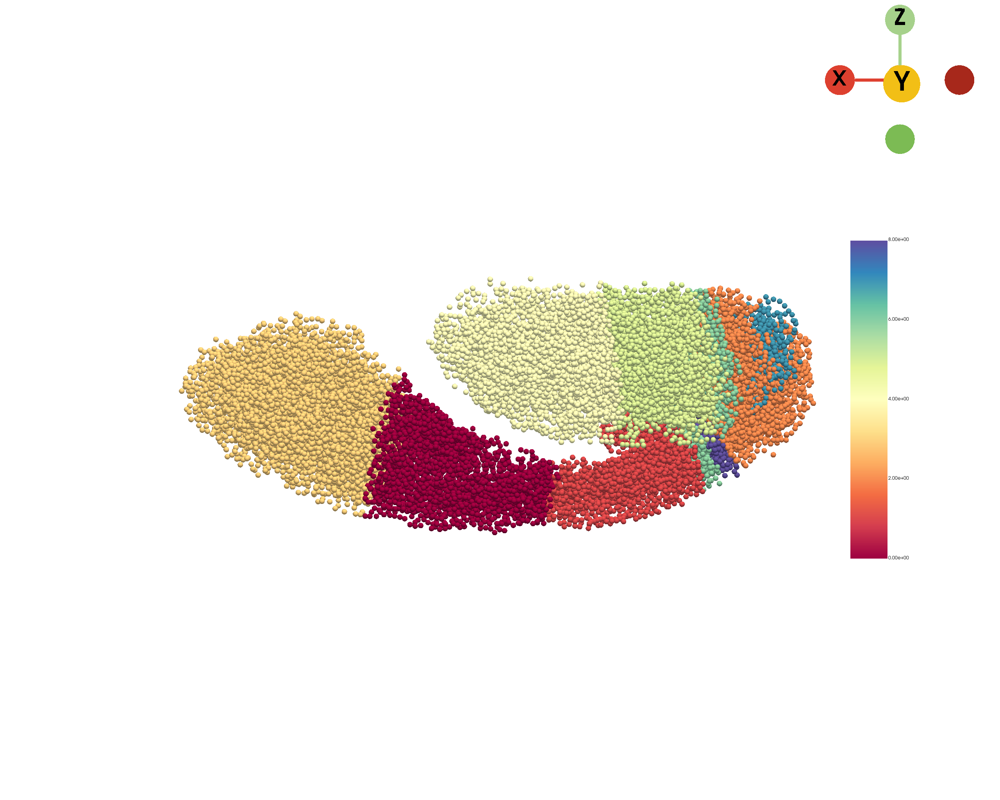

In [7]:
st.tdr.backbone_scc(
    adata=germ_adata, 
    backbone=st.tdr.read_model(f"pc_models/Germband_{sample_id}_aligned_backbone_model.vtk"),
    genes=list(glm_data.index), #["en", "gsb", "gsb-n", "wg", "ftz", "eve", "nkd", "ptc", "slp1", "slp2"],# list(glm_data.index),
    resolution=2.2,
    e_neigh=10,
    s_neigh=8,
    layer="X_counts",
    inplace=True
)
germ_adata.obs["backbone_scc"] = germ_adata.obs["backbone_scc"].map(lambda x: int(x))
pc_index = germ_pc.point_data["obs_index"].tolist()
st.tdr.add_model_labels(model=germ_pc, labels=germ_adata.obs.loc[pc_index, "backbone_scc"], key_added="backbone_scc", where="point_data", inplace=True, colormap="Spectral")
_ = st.pl.three_d_plot(
        model=germ_pc,
        key="backbone_scc",
        model_style="points",
        model_size=14,
        opacity=1,
        colormap="Spectral",
        show_legend=True,
        jupyter="static",
        cpo=cpo,
        window_size=(2560, 2048),
    )

In [8]:
np.unique(germ_adata.obs[["backbone_nodes", "backbone_scc"]], axis=0)

array([[ 0,  3],
       [ 1,  3],
       [ 2,  3],
       [ 3,  3],
       [ 4,  3],
       [ 5,  3],
       [ 6,  3],
       [ 7,  3],
       [ 8,  0],
       [ 9,  0],
       [10,  0],
       [11,  0],
       [12,  0],
       [13,  0],
       [14,  0],
       [15,  0],
       [16,  1],
       [17,  1],
       [18,  1],
       [19,  1],
       [20,  1],
       [21,  1],
       [22,  1],
       [23,  1],
       [24,  6],
       [25,  8],
       [26,  2],
       [27,  2],
       [28,  2],
       [29,  2],
       [30,  2],
       [31,  2],
       [32,  7],
       [33,  2],
       [34,  2],
       [35,  6],
       [36,  5],
       [37,  5],
       [38,  5],
       [39,  5],
       [40,  5],
       [41,  5],
       [42,  4],
       [43,  4],
       [44,  4],
       [45,  4],
       [46,  4],
       [47,  4],
       [48,  4],
       [49,  4]])

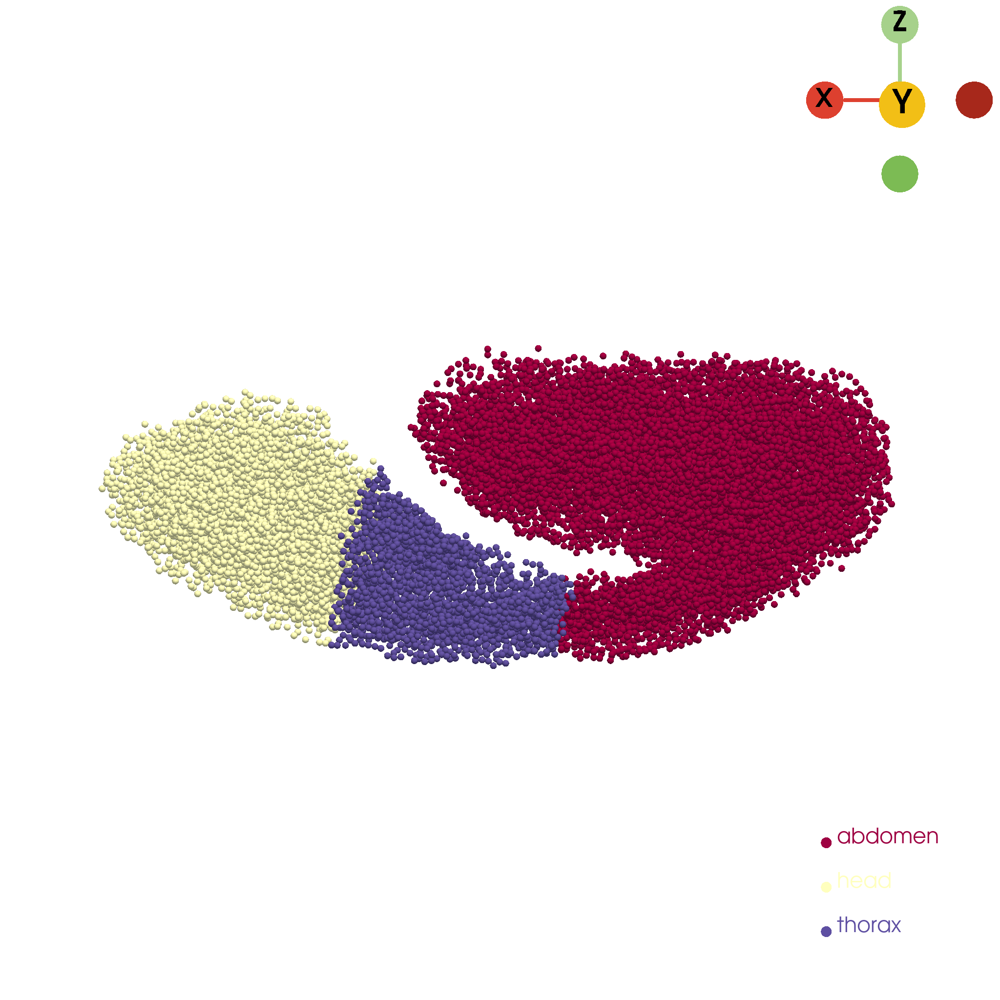

In [11]:
sorted_clustering = {3:"head", 0:"thorax", 1:"abdomen", 6:"abdomen", 4:"abdomen", 2:"abdomen", 7:"abdomen", 5:"abdomen", 8: "abdomen"}
germ_adata.obs["segments"] = germ_adata.obs["backbone_scc"].map(lambda x: sorted_clustering[int(x)])
pc_index = germ_pc.point_data["obs_index"].tolist()
st.tdr.add_model_labels(model=germ_pc, labels=germ_adata.obs.loc[pc_index, "segments"], key_added="segments", where="point_data", colormap="Spectral", inplace=True)
_ = st.pl.three_d_plot(
        model=germ_pc,
        key="segments",
        model_style="points",
        model_size=14,
        opacity=1,
        colormap=None,
        show_legend=True,
        jupyter="static",
        cpo=cpo,
        window_size=(2048, 2048),
        filename=os.path.join(out_image_path, f"{sample_id}_germband_segments_model.png")
    )

In [12]:
germ_adata.write_h5ad(f"h5ad/{sample_id}_germband_v3.h5ad", compression="gzip")
st.tdr.save_model(model=germ_pc, filename=f"pc_models/Germband_{sample_id}_aligned_pc_model.vtk")

## head and thorax

In [13]:
ht_adata = germ_adata[germ_adata.obs["segments"].isin(["head", "thorax"]), :]
ht_adata = ht_adata[ht_adata.layers["X_counts"].sum(axis=1) !=0, ht_adata.layers["X_counts"].sum(axis=0) !=0]
ht_adata.X = ht_adata.layers["X_counts"]
sc.pp.normalize_total(ht_adata)
sc.pp.log1p(ht_adata)
ht_adata

AnnData object with n_obs × n_vars = 8135 × 8074
    obs: 'area', 'slices', 'anno_cell_type', 'anno_tissue', 'anno_germ_layer', 'actual_stage', 'scc', 'anno_tissue_new', 'V_z', 'anno_germ_layer_new', 'backbone_nodes', 'backbone_scc', 'segments'
    uns: 'glm_degs', 'log1p', 'pp'
    obsm: '2d_realign_spatial', '3d_align_spatial', 'V_cells_mapping', 'X_cells_mapping', 'X_pca', 'X_umap', 'raw_spatial', 'tdr_spatial'
    layers: 'X_counts', 'spliced', 'unspliced'

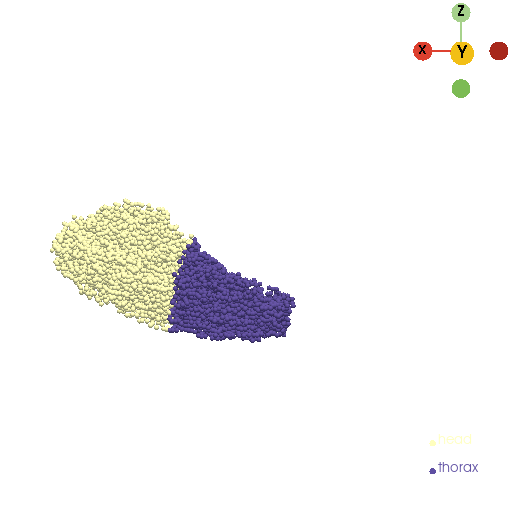

In [14]:
ht_pc = germ_pc.extract_points(germ_pc.point_data["segments"] != "abdomen")
st.pl.three_d_plot(
        model=ht_pc,
        key="segments",
        model_style="points",
        model_size=5,
        jupyter="static",
        cpo=cpo,
    )

In [15]:
GNs = ["Dfd", "Scr", "Antp", "Ubx", "rpr"]
for gn in GNs:
    _gn = str(gn).replace(":", "_") if ":" in gn else gn

    pc_index = ht_pc.point_data["obs_index"].tolist()
    exp = ht_adata[pc_index, gn].X.A.flatten()
    exp[exp <= 0] = 0

    amap = exp.copy()
    amap = amap / np.max(amap)
    amap[amap <= 0.2] = 0.2
    add_model_labels(model=ht_pc, labels=exp, key_added=gn, alphamap=amap, where="point_data", inplace=True, colormap="Purples")

    st.pl.three_d_plot(
        model=ht_pc,
        key=gn,
        model_style="points",
        model_size=14,
        colormap=None,
        show_legend=True,
        jupyter=False,
        off_screen=True,
        cpo=cpo,
        text=gn,
        window_size=(2560, 2048),
        filename=os.path.join(out_image_path, f"{sample_id}_germband_head_thorax_{_gn}.pdf")
    )

## abdomen

In [16]:
abdomen_adata = germ_adata[germ_adata.obs["segments"].isin(["abdomen"]), :]
abdomen_adata = abdomen_adata[abdomen_adata.layers["X_counts"].sum(axis=1) !=0, abdomen_adata.layers["X_counts"].sum(axis=0) !=0]
abdomen_adata.X = abdomen_adata.layers["X_counts"]
sc.pp.normalize_total(abdomen_adata)
sc.pp.log1p(abdomen_adata)
abdomen_adata

AnnData object with n_obs × n_vars = 12289 × 8108
    obs: 'area', 'slices', 'anno_cell_type', 'anno_tissue', 'anno_germ_layer', 'actual_stage', 'scc', 'anno_tissue_new', 'V_z', 'anno_germ_layer_new', 'backbone_nodes', 'backbone_scc', 'segments'
    uns: 'glm_degs', 'log1p', 'pp'
    obsm: '2d_realign_spatial', '3d_align_spatial', 'V_cells_mapping', 'X_cells_mapping', 'X_pca', 'X_umap', 'raw_spatial', 'tdr_spatial'
    layers: 'X_counts', 'spliced', 'unspliced'

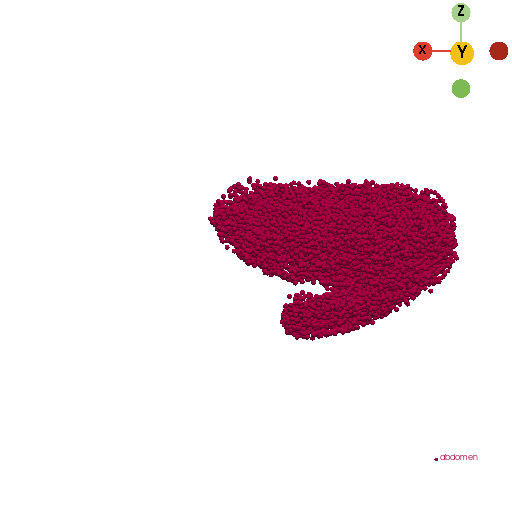

In [17]:
abdomen_pc = germ_pc.extract_points(germ_pc.point_data["segments"] == "abdomen")
st.pl.three_d_plot(
        model=abdomen_pc,
        key="segments",
        model_style="points",
        model_size=5,
        jupyter="static",
        cpo=cpo,
    )

In [18]:
GNs = ["abd-A", "Abd-B", "Ubx", "kni", "cad"]
for gn in GNs:
    _gn = str(gn).replace(":", "_") if ":" in gn else gn

    pc_index = abdomen_pc.point_data["obs_index"].tolist()
    exp = abdomen_adata[pc_index, gn].X.A.flatten()
    exp[exp <= 0] = 0

    amap = exp.copy()
    amap = amap / np.max(amap)
    amap[amap <= 0.2] = 0.2
    add_model_labels(model=abdomen_pc, labels=exp, key_added=gn, alphamap=amap, where="point_data", inplace=True, colormap="Purples")

    st.pl.three_d_plot(
        model=abdomen_pc,
        key=gn,
        model_style="points",
        model_size=14,
        colormap=None,
        show_legend=True,
        jupyter=False,
        off_screen=True,
        cpo=cpo,
        text=gn,
        window_size=(2560, 2048),
        filename=os.path.join(out_image_path, f"{sample_id}_germband_abdomen_{_gn}.pdf")
    )

## abdomen reclustering

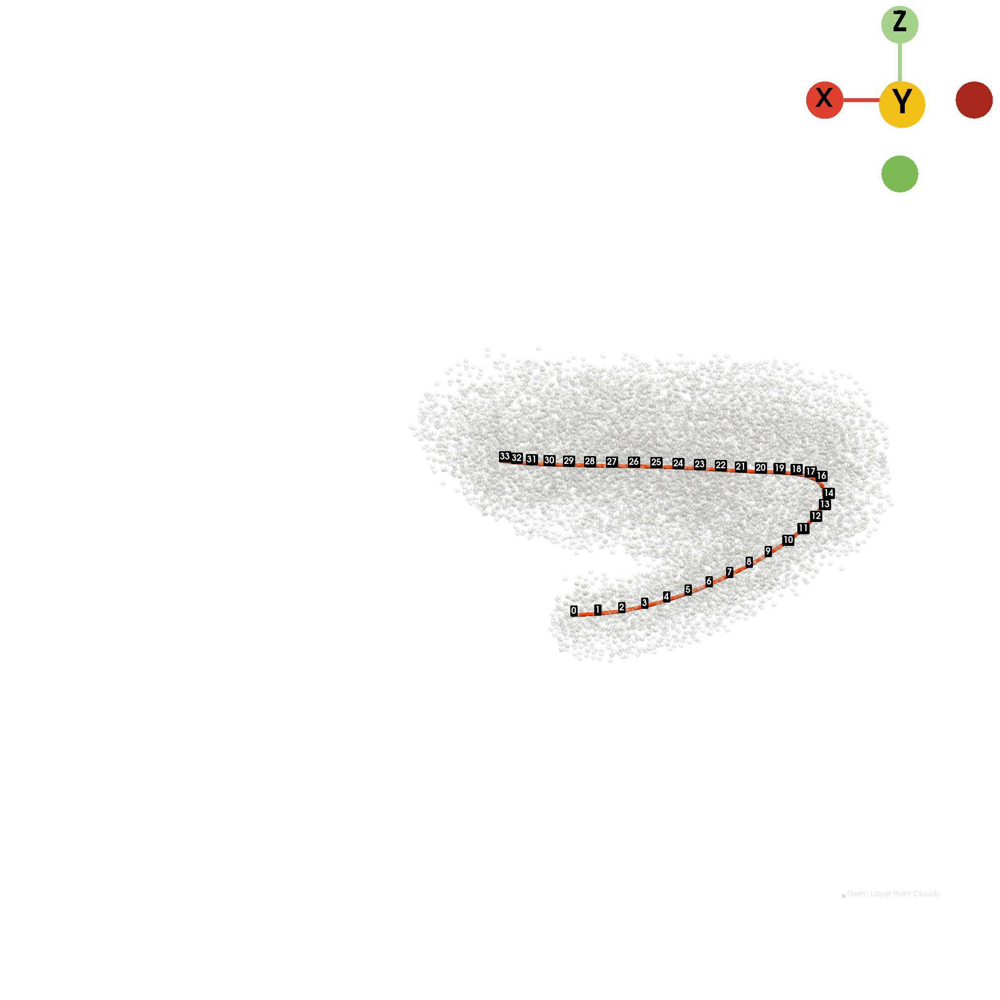

In [19]:
germ_backbone = st.tdr.read_model(f"pc_models/Germband_{sample_id}_aligned_backbone_model.vtk")
abdomen_backbone = st.tdr.update_backbone(backbone=germ_backbone, interactive=True, nodes_key="updated_nodes")
abdomen_backbone.point_data["updated_nodes"] = np.asarray([abdomen_backbone.n_points-1 - i for i in range(abdomen_backbone.n_points)])
st.pl.backbone(
    backbone_model=abdomen_backbone,
    bg_model=abdomen_pc,
    bg_key="backbone",
    nodes_key="updated_nodes",
    jupyter="static",
    cpo=cpo,
    filename=os.path.join(out_image_path, f"{sample_id}_abdomen_backbone_model_labels.pdf")
)

In [20]:
st.tdr.map_points_to_backbone(
    model=abdomen_pc,
    backbone_model=abdomen_backbone,
    nodes_key="updated_nodes",
    key_added="backbone_nodes",
    inplace=True,
)
obs_index = np.asarray(abdomen_pc.point_data["obs_index"])
abdomen_adata = abdomen_adata[obs_index, :].copy()
abdomen_adata.obs["backbone_nodes"] = np.asarray(abdomen_pc.point_data["backbone_nodes"])
abdomen_adata.X= abdomen_adata.layers["X_counts"].copy()
sc.pp.normalize_total(abdomen_adata)
sc.pp.log1p(abdomen_adata)

In [21]:
st.tl.glm_degs(
    adata=abdomen_adata,
    fullModelFormulaStr=f'~cr(backbone_nodes, df=3)',
    key_added="glm_degs",
    qval_threshold=0.01,
    llf_threshold=0
)
print(abdomen_adata.uns["glm_degs"]["glm_result"])

|-----? Gene expression matrix must be normalized by the size factor, please check if the input gene expression matrix is correct.If you don't have the size factor normalized gene expression matrix, please run `dynamo.pp.normalize_cell_expr_by_size_factors(skip_log = True)`.
|-----> [Detecting genes via Generalized Additive Models (GAMs)] in progress: 100.0000%
|-----> [Detecting genes via Generalized Additive Models (GAMs)] finished [1606.4183s]
        status family  log-likelihood          pval          qval
Abd-B       ok    NB2    -1185.479858  0.000000e+00  0.000000e+00
Obp99a      ok    NB2   -16190.106445  2.802597e-45  8.781937e-42
abd-A       ok    NB2    -1983.784302  9.809089e-45  2.744163e-41
otp         ok    NB2     -318.177002  1.029826e-36  2.087457e-33
Ppn         ok    NB2     -831.805237  2.931789e-36  4.754188e-33
...        ...    ...             ...           ...           ...
CG42394     ok    NB2    -1875.838745  1.471356e-04  8.836855e-03
hll         ok    NB2

In [22]:
glm_data = abdomen_adata.uns["glm_degs"]["glm_result"]
glm_data = glm_data.loc[glm_data["log-likelihood"] >= -2000, :]
glm_data = glm_data.loc[glm_data["pval"] <= 1e-8, :]
glm_data

,status,family,log-likelihood,pval,qval
Abd-B,ok,NB2,-1185.479858,0.000000e+00,0.000000e+00
abd-A,ok,NB2,-1983.784302,9.809089e-45,2.744163e-41
otp,ok,NB2,-318.177002,1.029826e-36,2.087457e-33
Ppn,ok,NB2,-831.805237,2.931789e-36,4.754188e-33
Npc2g,ok,NB2,-1165.323853,2.084579e-28,2.816961e-25
Gmap,ok,NB2,-1400.416382,5.068393e-25,5.136816e-22
Ubx,ok,NB2,-1424.389771,7.392244e-25,6.659591e-22
CG12011,ok,NB2,-1015.318481,1.891377e-23,1.533529e-20
fok,ok,NB2,-856.740173,9.711389e-20,5.624282e-17
CG12522,ok,NB2,-1317.973999,9.120809e-14,4.621970e-11


Saving figure to image/germband_reclustering/E7_8h_germband_abdomen_glm_degs_fit.pdf...
Done


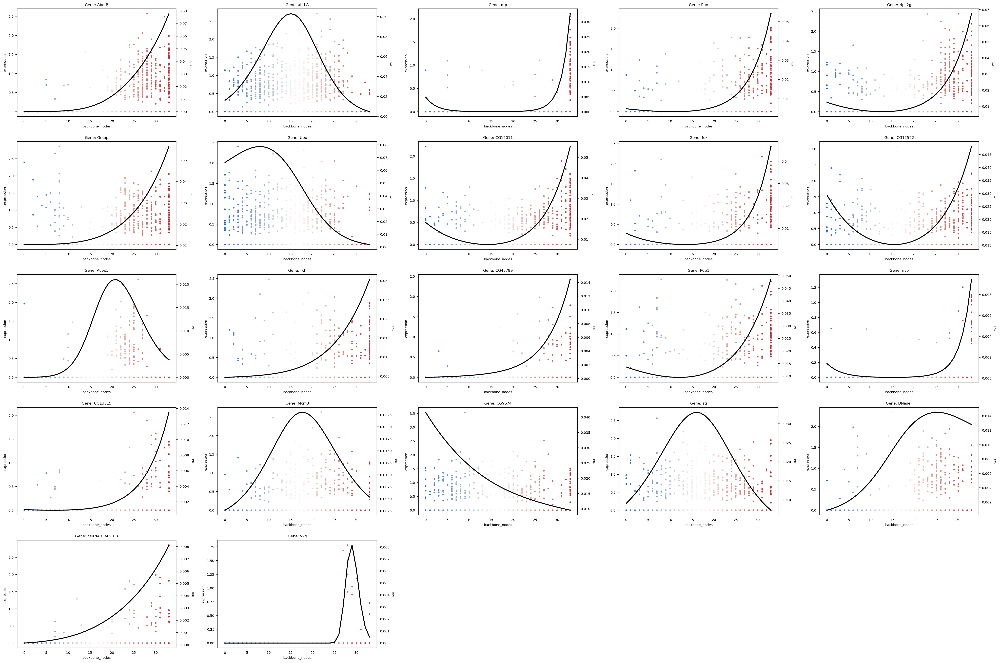

(<Figure size 3000x2000 with 44 Axes>,
 [<AxesSubplot:xlabel='backbone_nodes', ylabel='mu'>,
  <AxesSubplot:xlabel='backbone_nodes', ylabel='mu'>,
  <AxesSubplot:xlabel='backbone_nodes', ylabel='mu'>,
  <AxesSubplot:xlabel='backbone_nodes', ylabel='mu'>,
  <AxesSubplot:xlabel='backbone_nodes', ylabel='mu'>,
  <AxesSubplot:xlabel='backbone_nodes', ylabel='mu'>,
  <AxesSubplot:xlabel='backbone_nodes', ylabel='mu'>,
  <AxesSubplot:xlabel='backbone_nodes', ylabel='mu'>,
  <AxesSubplot:xlabel='backbone_nodes', ylabel='mu'>,
  <AxesSubplot:xlabel='backbone_nodes', ylabel='mu'>,
  <AxesSubplot:xlabel='backbone_nodes', ylabel='mu'>,
  <AxesSubplot:xlabel='backbone_nodes', ylabel='mu'>,
  <AxesSubplot:xlabel='backbone_nodes', ylabel='mu'>,
  <AxesSubplot:xlabel='backbone_nodes', ylabel='mu'>,
  <AxesSubplot:xlabel='backbone_nodes', ylabel='mu'>,
  <AxesSubplot:xlabel='backbone_nodes', ylabel='mu'>,
  <AxesSubplot:xlabel='backbone_nodes', ylabel='mu'>,
  <AxesSubplot:xlabel='backbone_nodes', yla

In [23]:
st.pl.glm_fit(
    adata=abdomen_adata,
    genes=glm_data.index.tolist(),
    ncols=5,
    feature_x="backbone_nodes",
    feature_y="expression",
    color_key="backbone_nodes",
    glm_key="glm_degs",
    show_legend=False,
    save_show_or_return="all",
    save_kwargs=dict(path=os.path.join(out_image_path, f"{sample_id}_germband_abdomen_glm_degs_fit"), prefix=None, ext="pdf",
                     dpi=300)
)

|-----> Start computing neighbor graph...
|-----> method arg is None, choosing methods automatically...
|-----------> method ball_tree selected
|-----> Start computing neighbor graph...
|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected
|-----> using adj_matrix from arg for clustering...
|-----> Detecting communities on graph...
|-----------> Converting graph_sparse_matrix to igraph object
|-----> [Community clustering with leiden] completed [13.7407s]


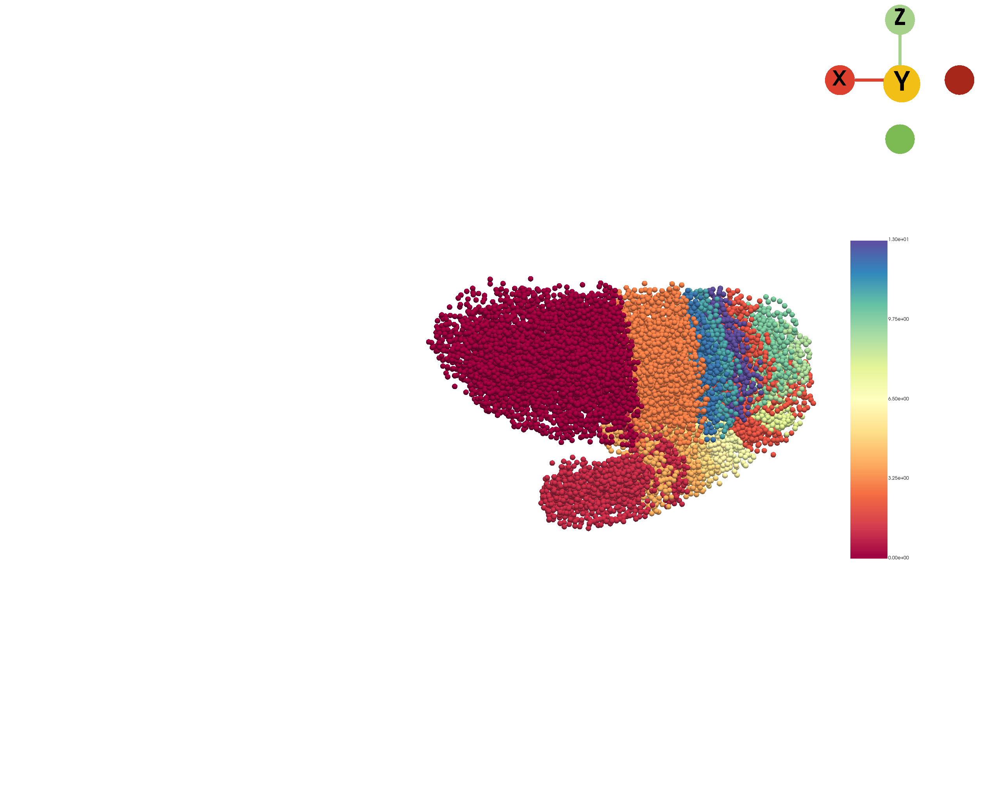

In [370]:
st.tdr.backbone_scc(
    adata=abdomen_adata, 
    backbone=abdomen_backbone,
    genes=list(glm_data.index), #["en", "gsb", "gsb-n", "wg", "ftz", "eve", "nkd", "ptc", "slp1", "slp2"],# list(glm_data.index),
    resolution=3,
    e_neigh=10,
    s_neigh=10,
    layer="X_counts",
    inplace=True
)
abdomen_adata.obs["backbone_scc"] = abdomen_adata.obs["backbone_scc"].map(lambda x: int(x))
pc_index = abdomen_pc.point_data["obs_index"].tolist()
st.tdr.add_model_labels(model=abdomen_pc, labels=abdomen_adata.obs.loc[pc_index, "backbone_scc"], key_added="backbone_scc", where="point_data", inplace=True, colormap="Spectral")
_ = st.pl.three_d_plot(
        model=abdomen_pc,
        key="backbone_scc",
        model_style="points",
        model_size=14,
        opacity=1,
        colormap="Spectral",
        show_legend=True,
        jupyter="static",
        cpo=cpo,
        window_size=(2560, 2048),
    )

In [24]:
GNs = glm_data.index
for gn in GNs:
    _gn = str(gn).replace(":", "_") if ":" in gn else gn

    pc_index = abdomen_pc.point_data["obs_index"].tolist()
    exp = abdomen_adata[pc_index, gn].X.A.flatten()
    exp[exp <= 0] = 0

    amap = exp.copy()
    amap = amap / np.max(amap)
    amap[amap <= 0.2] = 0.2
    add_model_labels(model=abdomen_pc, labels=exp, key_added=_gn, alphamap=amap, where="point_data", inplace=True, colormap="Purples")

    st.pl.three_d_plot(
        model=abdomen_pc,
        key=_gn,
        model_style="points",
        model_size=14,
        colormap=None,
        show_legend=True,
        jupyter=False,
        off_screen=True,
        cpo=cpo,
        text=gn,
        window_size=(2560, 2048),
        filename=os.path.join(out_image_path, f"{sample_id}_germband_abdomen_{_gn}.pdf")
    )

## Heatmap of segments

In [50]:
hox_genes = ["Dfd", "Scr", "Antp", "Ubx", "abd-A", "Abd-B"]
exp_data = pd.DataFrame(germ_adata[:, hox_genes].X.A, columns=hox_genes)
exp_data["segments"] = germ_adata.obs["segments"].values
exp_data = pd.DataFrame(exp_data.groupby(by="segments").mean())
exp_data = exp_data.loc[["head", "thorax", "abdomen"]]
exp_data

,Dfd,Scr,Antp,Ubx,abd-A,Abd-B
segments,,,,,,
head,0.012749,0.011177,0.003318,0.001746,0.002096,0.002445
thorax,0.000000,0.040681,0.078456,0.011623,0.003321,0.001660
abdomen,0.000163,0.000407,0.023436,0.051509,0.081862,0.045732


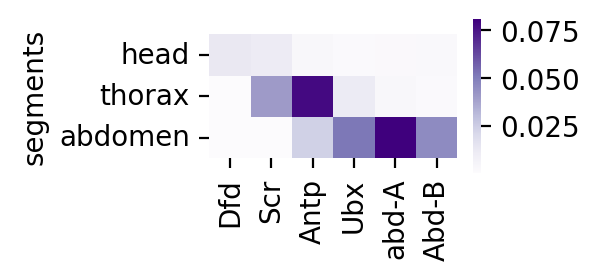

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns
f, ax = plt.subplots(figsize=(2, 1))
sns.heatmap(exp_data, ax=ax, cmap="Purples", robust=True, square=True)
plt.show()

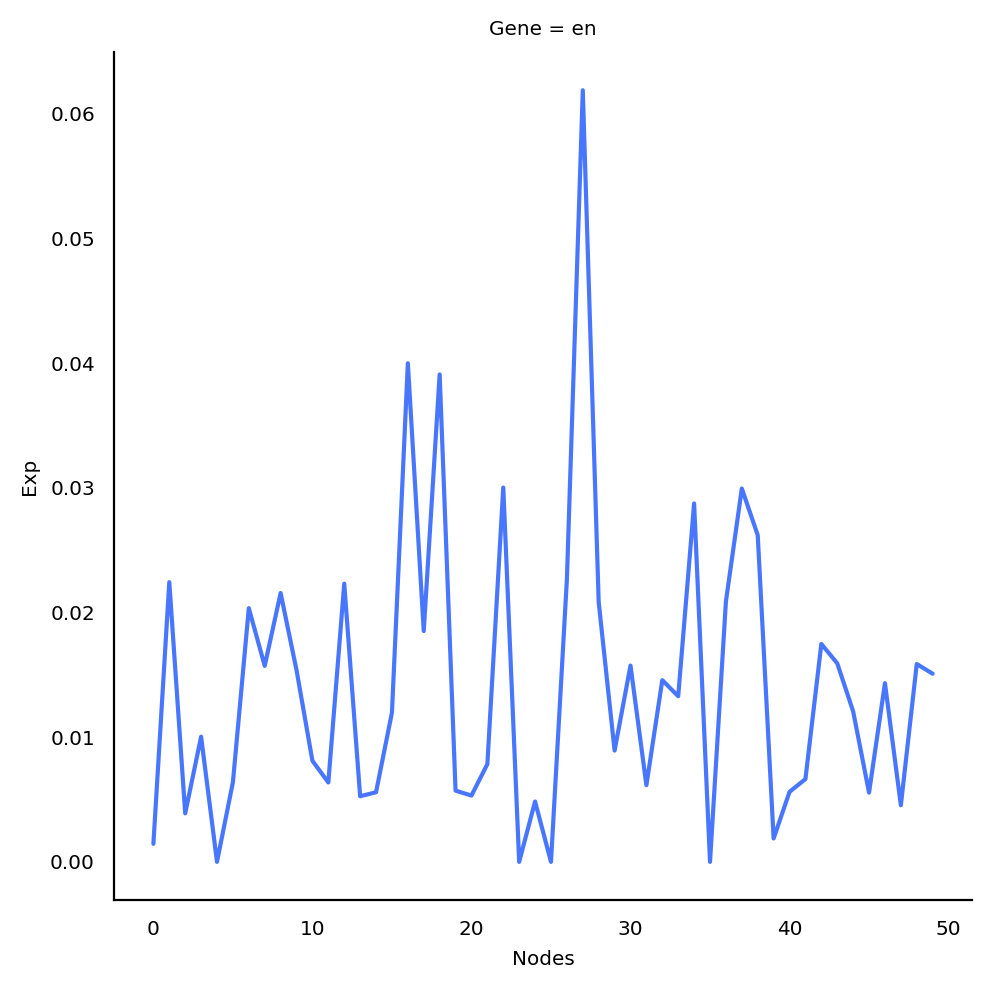

In [292]:
import matplotlib.pyplot as plt
import seaborn as sns
# GNs =["en", "gsb", "gsb-n", "wg", "ftz", "eve", "nkd", "ptc", "slp1", "slp2"]
#GNs = list(glm_data.index[:5])
GNs = ["en"]
segment_data = pd.DataFrame(germ_adata[:, GNs].layers["X_counts"].A, columns=GNs)
segment_data["backbone_nodes"] = germ_adata.obs["backbone_nodes"].tolist()
segment_data = pd.DataFrame(segment_data.groupby(by="backbone_nodes").mean())

updated_data = []
for i in GNs:
    data = pd.DataFrame(segment_data.loc[:, i].values, columns=["Exp"])
    data["Nodes"] = data.index
    data["Gene"] = i
    updated_data.append(data)
segment_data = pd.concat(updated_data, axis=0, ignore_index=True)
sns.relplot(data=segment_data, x="Nodes", y="Exp", col="Gene", kind="line")

#segment_data["backbone_scc"] = germ_adata.obs["backbone_scc"].tolist()
#segment_data = segment_data.groupby(by="backbone_scc").mean()
#sns.lineplot(data=segment_data, x="backbone_scc", y="gsb")


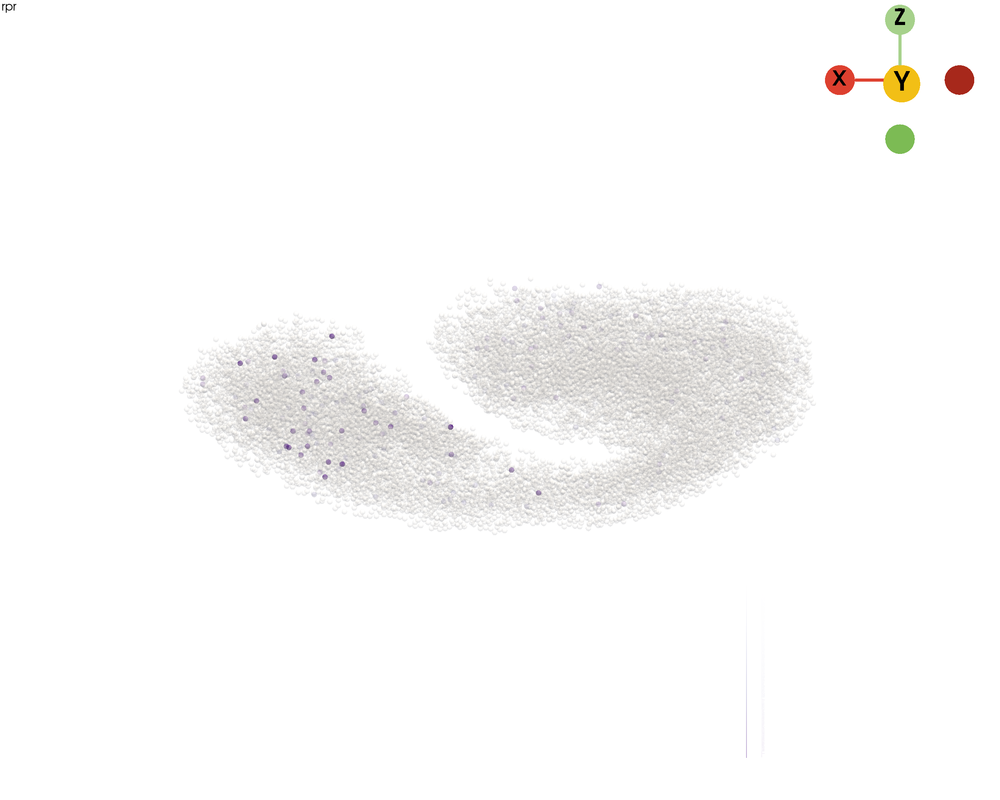

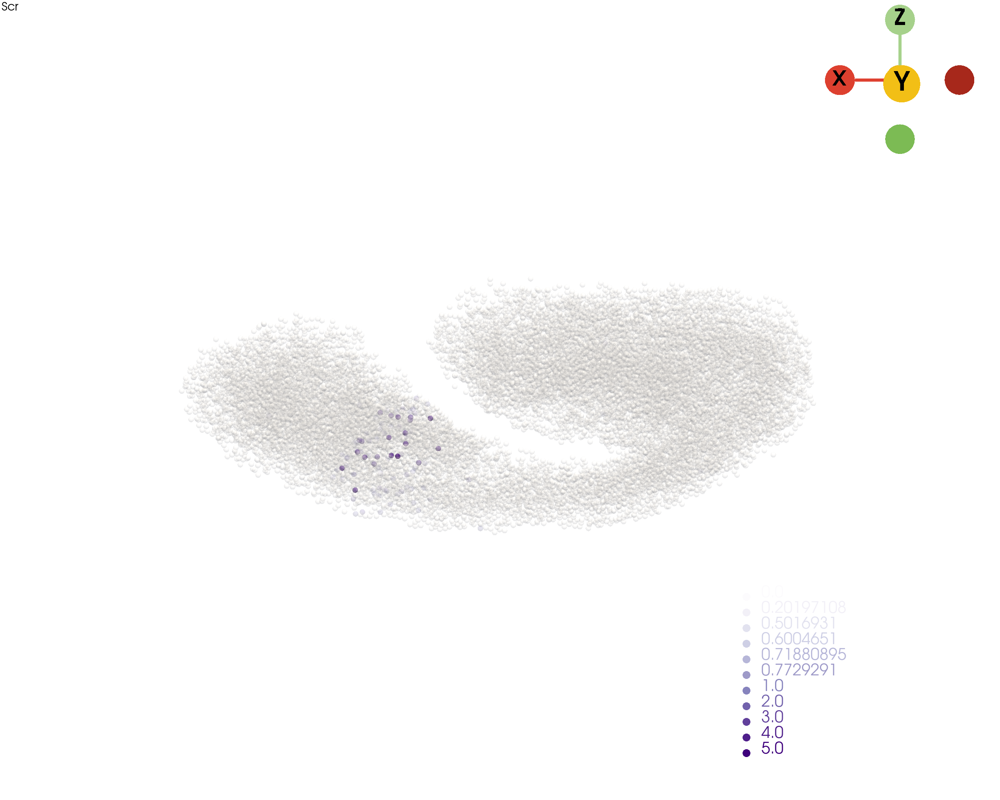

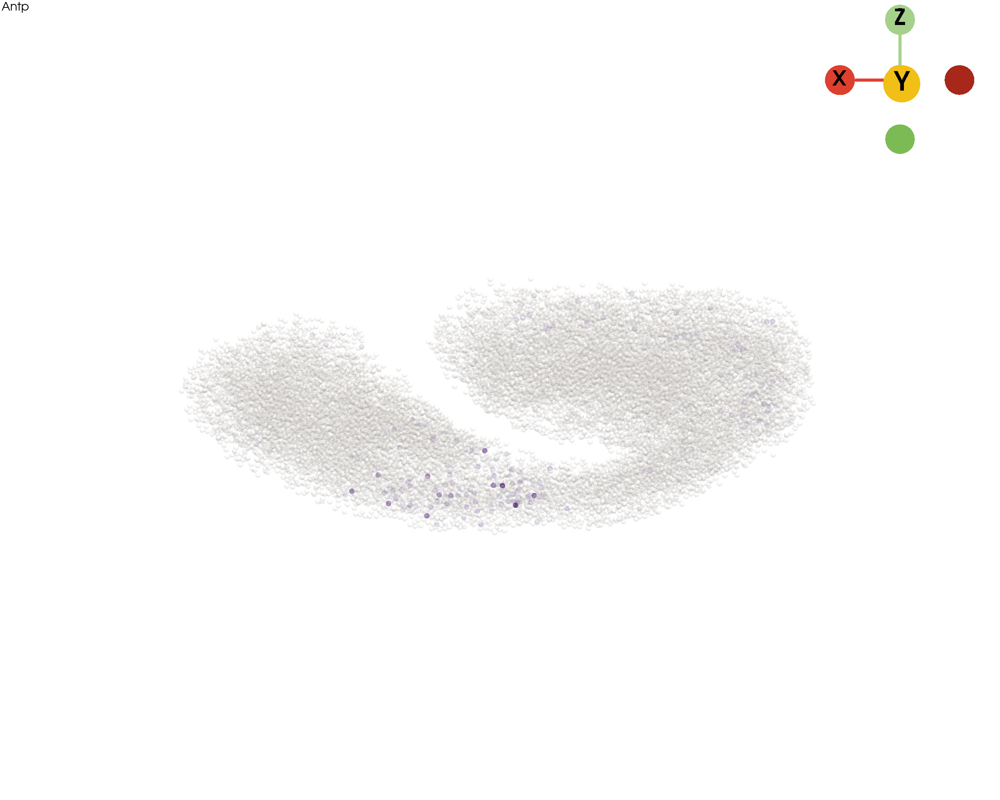

In [328]:
#GNs = ["en", "gsb", "gsb-n", "wg", "ftz", "eve", "nkd", "ptc"]

GNs = glm_data.index
for gn in GNs:
    _gn = str(gn).replace(":", "_") if ":" in gn else gn

    pc_index = germ_pc.point_data["obs_index"].tolist()
    exp = germ_adata[pc_index, gn].X.A.flatten()
    exp[exp <= 0] = 0

    amap = exp.copy()
    amap = amap / np.max(amap)
    amap[amap <= 0.4] = 0.2
    add_model_labels(model=germ_pc, labels=exp, key_added=gn, alphamap=amap, where="point_data", inplace=True, colormap="Purples")

    st.pl.three_d_plot(
        model=germ_pc,
        key=gn,
        model_style="points",
        model_size=14,
        opacity=1,
        colormap=None,
        show_legend=True,
        jupyter="static",
        cpo=cpo,
        text=gn,
        window_size=(2560, 2048),
        # filename=os.path.join(out_image_path, f"{sample_id}_germ_layer_pc_model_{_gn}.pdf")
    )

In [266]:
germ_adata.var.index[germ_adata.var.index.map(lambda x: str(x).startswith("O"))]

Index(['O-fut1', 'O-fut2', 'ORMDL', 'OXA1L', 'Oat', 'Oatp26F', 'Oatp30B',
       'Oatp58Dc', 'Oatp74D', 'Oaz', 'Obp18a', 'Obp28a', 'Obp44a', 'Obp56a',
       'Obp73a', 'Obp99a', 'Obp99c', 'Ocho', 'Ocrl', 'Oda', 'Odj', 'Oga',
       'Ogg1', 'Oli', 'Opa1', 'Opbp', 'Optix', 'Or43b', 'Orc1', 'Orc2', 'Orc3',
       'Orc4', 'Orc5', 'Orc6', 'Orct', 'Orct2', 'Ork1', 'Osbp', 'Oscillin',
       'Oseg1', 'Oseg4', 'Oseg5', 'Oseg6', 'Osi24', 'Ost48', 'OstDelta',
       'Ostgamma', 'Ote', 'OtopLa', 'Oxp'],
      dtype='object')